In [25]:
# preamble
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn import metrics
from scipy.special import gamma, beta, gammaln, betaln
import nilearn as ni
from nilearn import plotting as nplt
#from nilearn.maskers import NiftiLabelsMasker
#import nilearn.connectome
import nibabel as nib
import networkx as nx
from matplotlib.colors import ListedColormap
from data_processors import compute_A

# Data visualization

In [47]:
# general 

dataset = 'decnef' # 'hcp' or 'decnef'
my_dir = '/work3/s174162/speciale/'
atlas_name = 'schaefer'

### Diffferent graph types

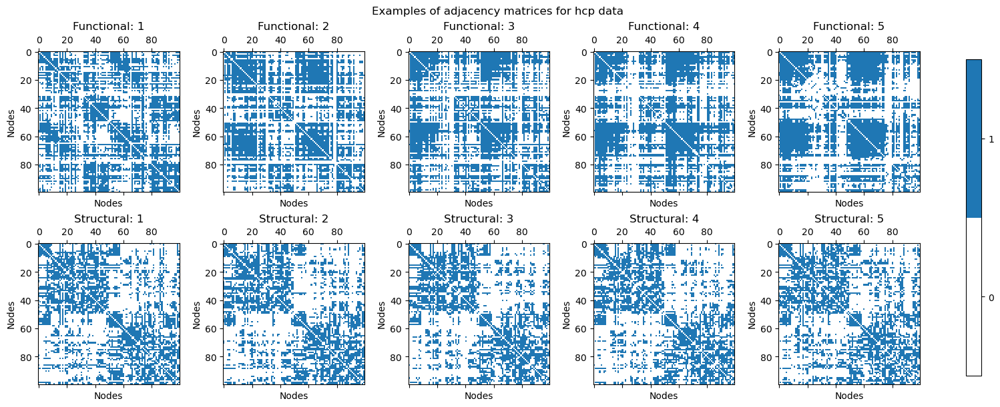

In [41]:
n_rois = 100 # 100, 200 or 300
data_folder_name = atlas_name+str(n_rois)
folder_path = os.path.join(my_dir, 'data/'+dataset+'/'+data_folder_name)

# compute A
A_vals_list = np.load(os.path.join(folder_path,'A1_vals_list.npy'))
A = compute_A(A_vals_list, n_rois)

if dataset == 'hcp':
    A_type1 = A[:,:,:250] # fmri
    A_type2 = A[:,:,250:] # dmri
else: #dataset == 'decnef'
    healthy_mask = np.load(my_dir+'/data/'+dataset+'/healthy_mask.npy')
    schizo_mask = np.load(my_dir+'/data/'+dataset+'/schizo_mask.npy')
    A_type1 = A[:,:,healthy_mask] # healthy
    A_type2 = A[:,:,schizo_mask] # schizo

fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

default_blue = '#1f77b4'
cmap_binary = ListedColormap(['white', default_blue]) 

for s in range(10):
    if s < 5:
        im = axs[s].spy(A_type1[:,:,s], cmap=cmap_binary)
        if dataset=='hcp':
            axs[s].set_title('Functional: '+str(s+1))
        else:
            axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].spy(A_type2[:,:,-(s-4)], cmap=cmap_binary)
        if dataset=='hcp':
            axs[s].set_title('Structural: '+str(s-4))
        else:
            axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

fig.suptitle('Examples of adjacency matrices for ' + dataset + ' data')
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.95)
plt.savefig(my_dir+'/figures/'+dataset+'_data.png', bbox_inches='tight')

### Different number of brain areas (atlas resolution)

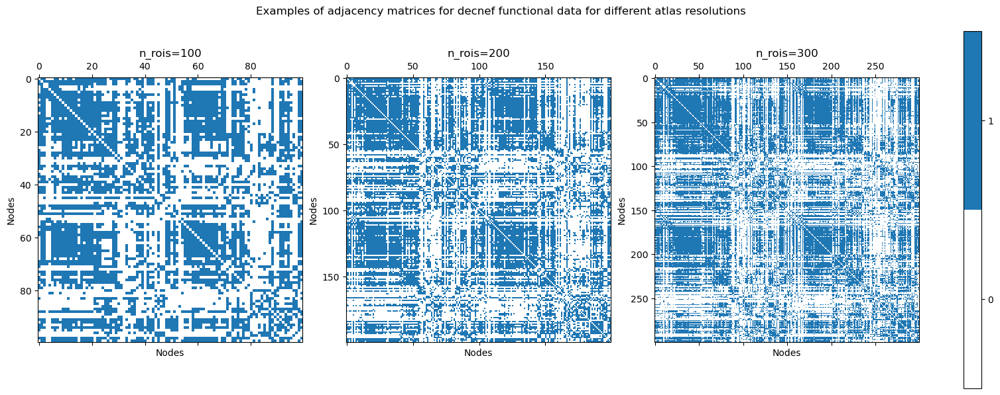

In [48]:
n_rois = 100 # 100, 200 or 300

# compute A
A1_100_vals_list = np.load(os.path.join(my_dir, 'data/'+dataset+'/'+atlas_name+'100/A1_vals_list.npy'))
A1_100 = compute_A(A1_100_vals_list, n_rois=100)

A1_200_vals_list = np.load(os.path.join(my_dir, 'data/'+dataset+'/'+atlas_name+'200/A1_vals_list.npy'))
A1_200 = compute_A(A1_200_vals_list, n_rois=200)

A1_300_vals_list = np.load(os.path.join(my_dir, 'data/'+dataset+'/'+atlas_name+'300/A1_vals_list.npy'))
A1_300 = compute_A(A1_300_vals_list, n_rois=300)

fig, axs = plt.subplots(1,3, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

ex_subject = 0 # example subject
default_blue = '#1f77b4'
cmap_binary = ListedColormap(['white', default_blue]) 

im = axs[0].spy(A1_100[:,:,ex_subject], cmap=cmap_binary)
axs[0].set_ylabel('Nodes')
axs[0].set_xlabel('Nodes')
axs[0].set_title('n_rois=100')

im = axs[1].spy(A1_200[:,:,ex_subject], cmap=cmap_binary)
axs[1].set_ylabel('Nodes')
axs[1].set_xlabel('Nodes')
axs[1].set_title('n_rois=200')

im = axs[2].spy(A1_300[:,:,ex_subject], cmap=cmap_binary)
axs[2].set_ylabel('Nodes')
axs[2].set_xlabel('Nodes')
axs[2].set_title('n_rois=300')
 
if dataset=='hcp':   
    fig.suptitle('Examples of adjacency matrices for ' + dataset + ' healthy data for different atlas resolutions')
else:
    fig.suptitle('Examples of adjacency matrices for ' + dataset + ' functional data for different atlas resolutions')
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.95)
plt.savefig(my_dir+'/figures/'+dataset+'_data_nrois.png', bbox_inches='tight')

### Different thresholds (threshold annealing)

Number of nonzero elements:


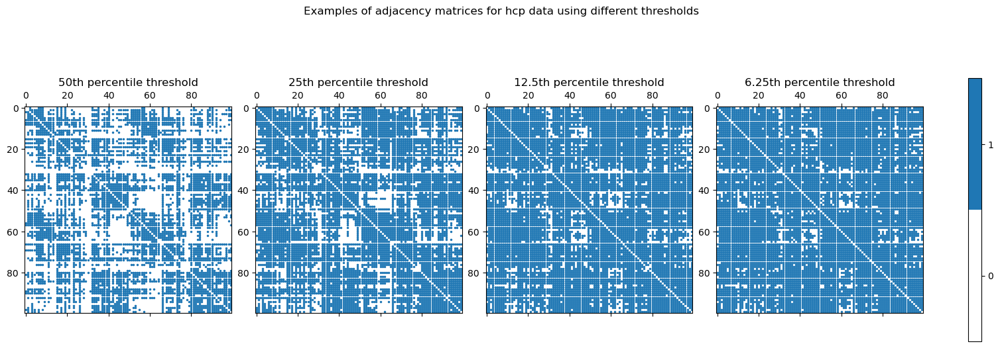

In [42]:
n_rois = 100 # 100, 200 or 300
data_folder_name = atlas_name+str(n_rois)
folder_path = os.path.join(my_dir, 'data/'+dataset+'/'+data_folder_name)

# compute A
A1_vals_list = np.load(os.path.join(folder_path,'A1_vals_list.npy'))
A1 = compute_A(A1_vals_list, n_rois)
A2_vals_list = np.load(os.path.join(folder_path,'A2_vals_list.npy'))
A2 = compute_A(A2_vals_list, n_rois)
A3_vals_list = np.load(os.path.join(folder_path,'A3_vals_list.npy'))
A3 = compute_A(A3_vals_list, n_rois)
A4_vals_list = np.load(os.path.join(folder_path,'A4_vals_list.npy'))
A4 = compute_A(A4_vals_list, n_rois)

# showing the four different graphs for a single subject
sub_id = 0
fig, axs = plt.subplots(1,4, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()
axs[0].spy(A1[:,:,sub_id], marker='.', markersize=3)
axs[0].set_title('50th percentile threshold')
axs[1].spy(A2[:,:,sub_id], marker='.', markersize=3)
axs[1].set_title('25th percentile threshold')
axs[2].spy(A3[:,:,sub_id], marker='.', markersize=3)
axs[2].set_title('12.5th percentile threshold')
axs[3].spy(A4[:,:,sub_id], marker='.', markersize=3)
axs[3].set_title('6.25th percentile threshold')
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.7)

print('Number of nonzero elements:')
(A1[:,:,sub_id] > 0).sum(), (A2[:,:,sub_id] > 0).sum(), (A3[:,:,sub_id] > 0).sum(), (A4[:,:,sub_id] > 0).sum()
fig.suptitle('Examples of adjacency matrices for ' + dataset + ' data using different thresholds')
plt.savefig(my_dir+'/figures/'+dataset+'_data_anneal.png', bbox_inches='tight')

# Distributions
https://datascience.oneoffcoder.com/dirichlet-multinomial-distribution.html

In [1]:
# Dirichlet-Multinomial prior
def logDirMult(N, K, alpha, n_k):
    # not in log: (gamma(N + 1) * gamma(K + alpha)) / gamma(K*alpha + N) * np.prod(gamma(n_k + alpha)/(gamma(n_k + 1) * gamma(alpha)))
    return gammaln(K*alpha) - gammaln(K * alpha + N) - K * gammaln(alpha) + np.sum(gammaln(n_k + alpha))
    # model implementation:
    #gammaln(self.noc * self.alpha) - gammaln(self.noc * self.alpha + self.N) - self.noc * gammaln(self.alpha) + np.sum(gammaln(self.sumZ + self.alpha))

# Chinese Restaurant Process prior
def logCRP(N, K, alpha, n_k):
    # not in log: (gamma(alpha) * alpha**K) / gamma(alpha + N) * np.prod(gamma(n_k))
    return gammaln(alpha) + K * np.log(alpha) - gammaln(alpha + N) + np.sum(gammaln(n_k))
    # model implementation: 
    # gammaln(self.alpha) + self.noc * np.log(self.alpha) - gammaln(self.alpha + self.N) + constZ
    # where constZ = np.sum(gammaln(self.sumZ))
   
# Dirichlet prior
def logDir(eta, eta0):
    # not in log: 1/beta(eta0) * np.prod(eta**(eta0-1))
    S = len(eta0)
    return gammaln(eta0*S) - np.log(gamma(eta0)**S) + np.sum(np.log(eta**(eta0-1)))

# Multinomial likelihood
def logMult(nu, eta0, K, X, normalize=False):
    C = np.triu(gammaln(np.sum(X+1,axis=2)) - np.sum(gammaln(X+1),axis=2)).sum()
    logBeta_nueta0 = np.sum(gammaln(nu + eta0),axis=-1) - gammaln(np.sum(nu + eta0,axis=-1))
    logBeta_eta0 = - np.sum(gammaln(eta0),axis=-1) + gammaln(np.sum(eta0,axis=-1))
    if normalize:
        return C - K*(K+1)/2*logBeta_eta0 + np.triu(logBeta_nueta0).sum()
    else:
        return np.triu(logBeta_nueta0-logBeta_eta0).sum() # same as -K*(K+1)/2*logBeta_eta0 + np.triu(logBeta_nueta0).sum()
    
    # model implementation:
    # np.triu(mult_eval).sum() - self.noc * (self.noc + 1) / 2 * const 
    # where mult_eval = self.multinomialln(n_link + self.eta0)
    # and const = self.multinomialln(self.eta0) 
    

In [13]:
sumZ = 5
alpha = 3
gamma(sumZ + 1 + alpha)/gamma(sumZ + alpha)

8.0

In [14]:
import math
math.factorial(sumZ+alpha)/math.factorial(sumZ+alpha-1)

8.0

In [8]:
sumZ+alpha

8

In [3]:
S = 3
N = 10
K = 50

X = np.random.rand(N, N, S) > 0.3
Z = np.random.rand(K, N) > 0.5
alpha = np.log(N)
eta0 = np.ones(S)
eta = np.random.rand(K, K, S)
n_k = np.sum(Z, axis=0)
nu = np.random.rand(K, K, S)

In [4]:
logZ_DirMult = logDirMult(N, K, alpha, n_k)
logZ_CRP = logCRP(N, K, alpha, n_k)
logeta_Dir = logDir(eta, eta0)
logX_Mult = logMult(nu, eta0, K, X, normalize=False)
logX_Mult_norm = logMult(nu, eta0, K, X, normalize=True)
print('logZ_DirMult =', logZ_DirMult)
print('logZ_CRP =', logZ_CRP)
print('logeta_Dir =', logeta_Dir)
print('logX_Mult =', logX_Mult)
print('logX_Mult_norm =', logX_Mult_norm)

logZ_DirMult = 529.146961055138
logZ_CRP = 534.9255822250042
logeta_Dir = [0.69314718 0.69314718 0.69314718]
logX_Mult = -4354.386041494815
logX_Mult_norm = -4161.919591374235


In [5]:
# testing method for computing nlink (nu)
X_test = np.array([[0,1,0,1,0],[1,0,1,0,1],[0,1,0,1,0],[1,0,1,0,1],[0,1,0,1,0]])
Z_test = np.array([[1,0,1,0,0],[0,1,0,1,0],[0,0,0,0,1]])
n_linktest = Z_test @ X_test @ Z_test.T
print(n_linktest) 

[[0 4 0]
 [4 0 2]
 [0 2 0]]


In [5]:
#df = pd.read_csv(os.path.join(main_dir,'results/synthetic/nonparametric_Nc50_K5_S15_S25_1a96daaf-799f-4409-a0a6-57bcb2fa51e1/log.txt'),sep=":",header=None)

'''
Nc = df.iloc[3].values[1].strip()
K = df.iloc[4].values[1].strip()
S1 = df.iloc[5].values[1].strip()
S2 = df.iloc[6].values[1].strip()Nc = df.iloc[3].values[1].strip()
K = df.iloc[4].values[1].strip()
S1 = df.iloc[5].values[1].strip()
S2 = df.iloc[6].values[1].strip()
'''

In [3]:
main_dir = os.getcwd()
#general functions

def get_exp_folders(main_dir, dataset, model_type, var):

    # list of supfolders for model-specific experiments
    supexp_folders = [item for item in os.listdir(os.path.join(main_dir, 'results/'+dataset)) if model_type in item] 
    
    # list of subfolders for specified model experiments
    exp_folders = [os.path.join(main_dir, 'results/'+dataset+'/'+str(item)) for item in supexp_folders if str(var) in item]
    return exp_folders

def get_stats(exp_folders, par):
    
    par_list = []
    for i in range(len(exp_folders)):
        folder = exp_folders[i]
        sample = np.load(os.path.join(folder,'model_sample.npy'), allow_pickle=True).item()
        par_list.append(sample[par])
        # compute mean logP at each iteration across all experiments
        mean_par = np.mean(par_list, axis=0)
        # compute min and max logP at each iteration
        min_par = np.min(par_list, axis=0)
        max_par = np.max(par_list, axis=0)
    return par_list, mean_par, min_par, max_par

def plot_par(dataset, exp_folder_list1, exp_folder_list2, par, plot1=True, plot2=True, miniter_gibbs=None, maxiter_gibbs=None):
    
    # Input: 
    # exp_folder_lists: list of experiment folder names (1 is without annenaling, 2 is with annealing)
    # par: parameter to plot as a function of Gibbs iterations, e.g. 'logP' or 'noc'
    
    # Output: plot of parameter as a function of Gibbs iterations
    
    exp_folder_list1 = [os.path.join(main_dir,'results/'+dataset+'/'+folder) for folder in exp_folder_list1]
    exp_folder_list2 = [os.path.join(main_dir,'results/'+dataset+'/'+folder) for folder in exp_folder_list2]
    
    plt.figure()
    #for i in range(len(exp_folder_list)):
    #exp_folder = exp_folder_list[i]
    if plot1:
        _, mean_par, min_par, max_par = get_stats(exp_folder_list1, par)
        iters = range(len(mean_par))
        if miniter_gibbs is None:
            miniter_gibbs = iters[0]
        if maxiter_gibbs is None:
            maxiter_gibbs = iters[-1]
        #plt.errorbar(iters, mean_logP, yerr=max_logP-min_logP, fmt='-o', capsize=5, label=var)
        plt.plot(iters[miniter_gibbs:maxiter_gibbs], mean_par[miniter_gibbs:maxiter_gibbs],'-bo', label='exp1')
        plt.fill_between(iters[miniter_gibbs:maxiter_gibbs], min_par[miniter_gibbs:maxiter_gibbs], max_par[miniter_gibbs:maxiter_gibbs], alpha=0.5, color='blue')

    if plot2:
        _, mean_par, min_par, max_par = get_stats(exp_folder_list2, par)
        iters = range(len(mean_par))
        #miniter_gibbs = iters[0]
        #maxiter_gibbs = iters[-1]
        #plt.errorbar(iters, mean_logP, yerr=max_logP-min_logP, fmt='-o', capsize=5, label=var)
        plt.plot(iters[miniter_gibbs:maxiter_gibbs], mean_par[miniter_gibbs:maxiter_gibbs],'-ro', label='exp2')
        plt.fill_between(iters[miniter_gibbs:maxiter_gibbs], min_par[miniter_gibbs:maxiter_gibbs], max_par[miniter_gibbs:maxiter_gibbs], alpha=0.5, color='red')

    plt.title(par + ' - ' + dataset)
    plt.ylabel(par)
    plt.xlabel('Gibbs iterations')
    plt.legend()
    plt.show()

# Synthetic data experiments

In [3]:
dataset = 'synthetic'
exp_name = 'nonparametric_Nc50_K5_S15_S25_2023-04-05 15:07:38.303194'
# load result 
#sample = np.load(main_dir+'/results/'+dataset+'/'+exp_name+'/model_sample.npy', allow_pickle=True).item()
# (MAP sample)
#MAP_sample = np.load('results/'+dataset+'/'+res_folder_name+'/model_sample.npy', allow_pickle=True).item()['MAP']


In [9]:
dataset = 'synthetic'

experiments_list = ['Nc50', 'Nc100', 'Nc150']
model_type = 'parametric'

maxiter_gibbs = 20
iters = np.arange(maxiter_gibbs)

plt.figure()
for i in range(len(experiments_list)):
     var = experiments_list[i]
     exp_folder = get_exp_folders(main_dir, dataset, model_type, var)
     _, mean_logP, min_logP, max_logP = get_stats(exp_folder, par='logP')
     iters = range(len(mean_logP))
     #plt.errorbar(iters, mean_logP, yerr=max_logP-min_logP, fmt='-o', capsize=5, label=var)
     plt.plot(iters, mean_logP,'-o', label=model_type+'_'+var)
     plt.fill_between(iters, min_logP, max_logP, alpha=0.5)

plt.title('Log posterior probability P(Z|A) - ' + dataset)
plt.ylabel('Log probability')
plt.xlabel('Gibbs iterations')
plt.legend()
plt.show()
     

FileNotFoundError: [Errno 2] No such file or directory: '/work3/s174162/speciale/results/synthetic/nonparametric_Nc50_K5_S15_S25_2023-05-01 11:40:23.753112/model_sample.npy'

<Figure size 640x480 with 0 Axes>

# Human Connectome Project (HCP) data experiments

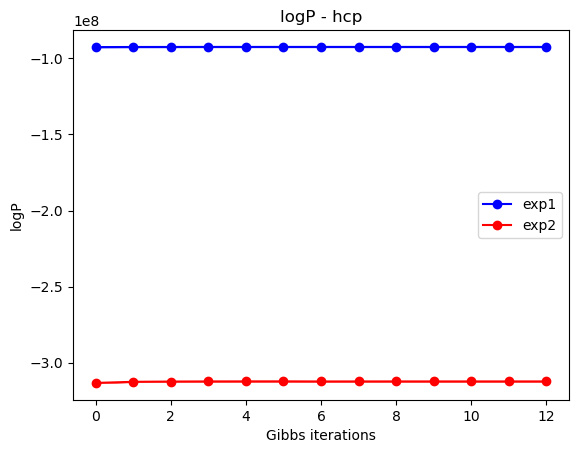

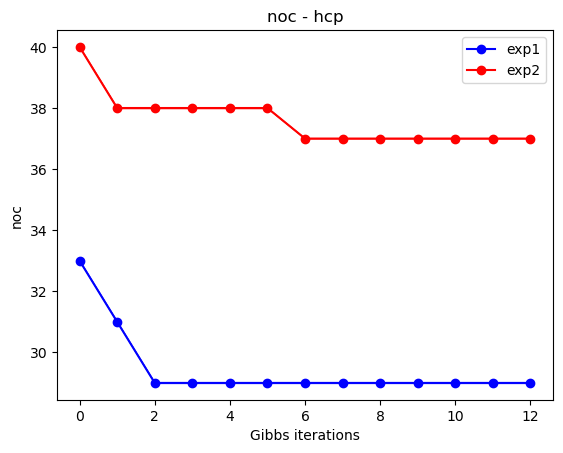

In [7]:
dataset = 'hcp'

exp_folder_list1 = ['parametric_schaefer100_2023-05-10 07:15:31.276172']#['parametric_schaefer100_2023-05-10 04:48:52.298707']#,
 #'parametric_schaefer100_2023-05-10 07:15:31.276172',
 #'parametric_schaefer100_2023-05-09 21:32:49.017710',
 #'parametric_schaefer100_2023-05-10 09:43:35.562203',
 #'parametric_schaefer100_2023-05-09 20:52:42.647668',
 #'parametric_schaefer100_2023-05-10 02:28:59.847166',
 #'parametric_schaefer100_2023-05-09 23:38:22.698491']

exp_folder_list2 = ['parametric_schaefer200_2023-05-09 20:52:42.642443']#,
 #'parametric_schaefer200_2023-05-10 10:11:27.460297',
 #'parametric_schaefer200_2023-05-09 21:45:13.447274',
 #'parametric_schaefer200_2023-05-10 07:38:11.427518',
 #'parametric_schaefer200_2023-05-10 05:08:21.831109',
 #'parametric_schaefer200_2023-05-10 02:46:02.712231',
 #'parametric_schaefer200_2023-05-10 00:03:25.202146']

plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=True)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True)
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=True, plot2=True)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=False, plot2=True)


# show logP for model without annealign for the 100 iterations
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=False, miniter_gibbs=0, maxiter_gibbs=100)

# show logP for model with annealing for each 100 iterations (up to 400)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=0, maxiter_gibbs=100)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=100, maxiter_gibbs=200)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=200, maxiter_gibbs=300)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=300, maxiter_gibbs=400)


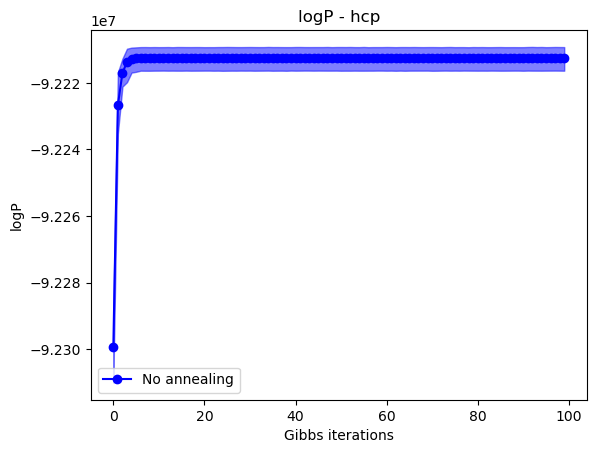

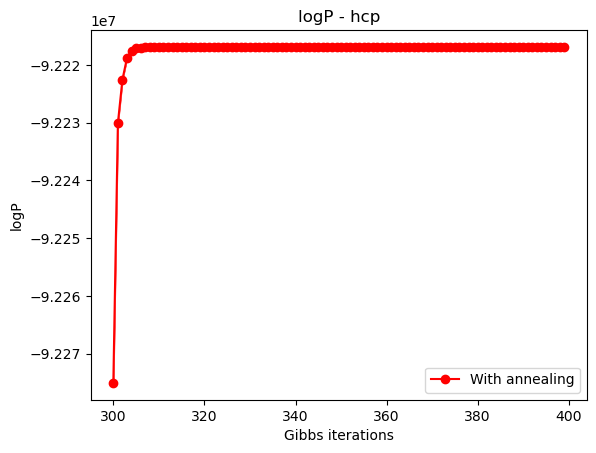

In [34]:
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=False, miniter_gibbs=0, maxiter_gibbs=100)
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=300, maxiter_gibbs=400)

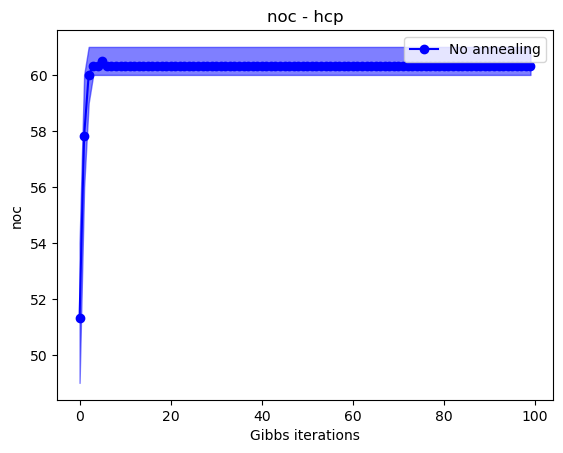

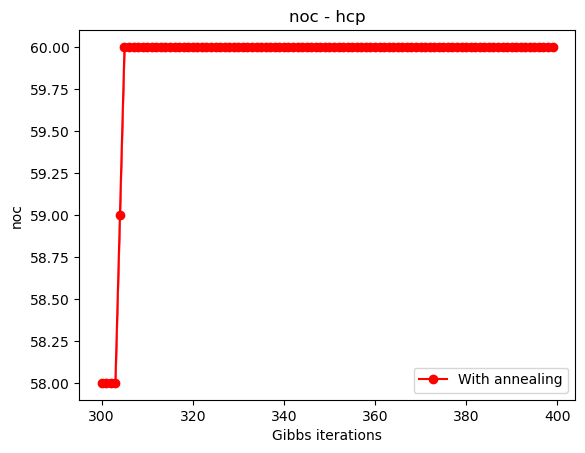

In [41]:
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=True, plot2=False, miniter_gibbs=0, maxiter_gibbs=100)
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=False, plot2=True, miniter_gibbs=300, maxiter_gibbs=400)

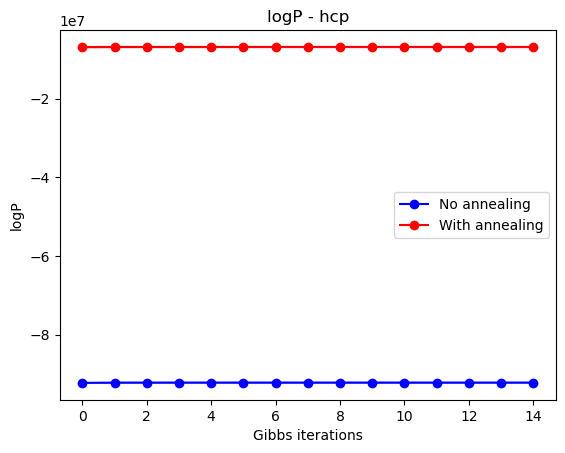

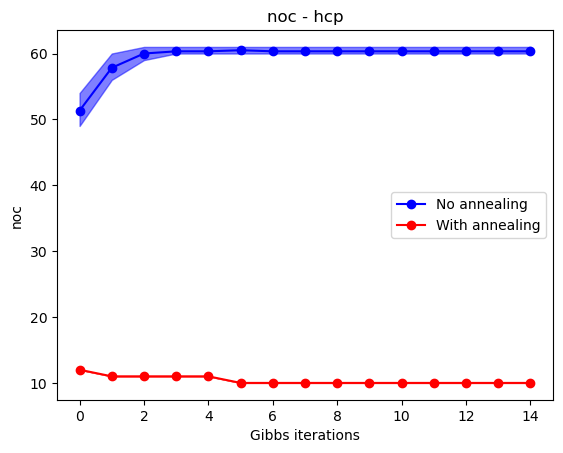

In [33]:
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=True, miniter_gibbs=0, maxiter_gibbs=15)
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=True, plot2=True, miniter_gibbs=0, maxiter_gibbs=15)

In [8]:
exp_name = exp_folder_list2[0]
# load result 
sample = np.load(main_dir+'/results/'+dataset+'/'+exp_name+'/model_sample.npy', allow_pickle=True).item()
MAP_sample = sample['MAP']

In [9]:
iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
alpha = MAP_sample['alpha']
eta0 = MAP_sample['eta0']

In [10]:
print('MAP logP(Z|A) =', logP)
print('MAP noc =', noc)
print('MAP alpha =', alpha)
#print('eta0 =', eta0)

MAP logP(Z|A) = -312253429.61709046
MAP noc = 38
MAP alpha = 59.34220722255279


Text(0.5, 0, 'subject')

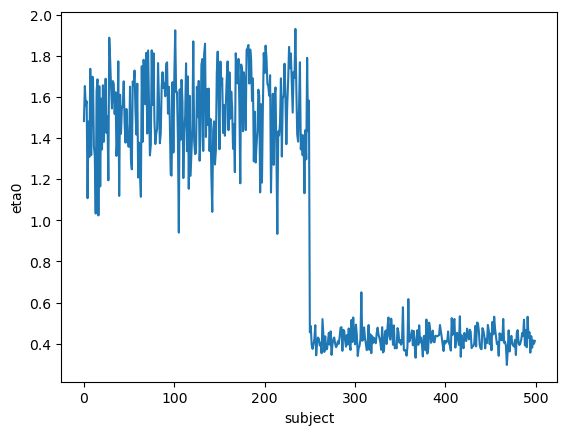

In [11]:
plt.plot(eta0)
plt.ylabel('eta0')
plt.xlabel('subject')
# only shows global differences (over subjects) whereas eta shows local differences (over brain regions)

Text(0.5, 1.0, 'MAP partition Z')

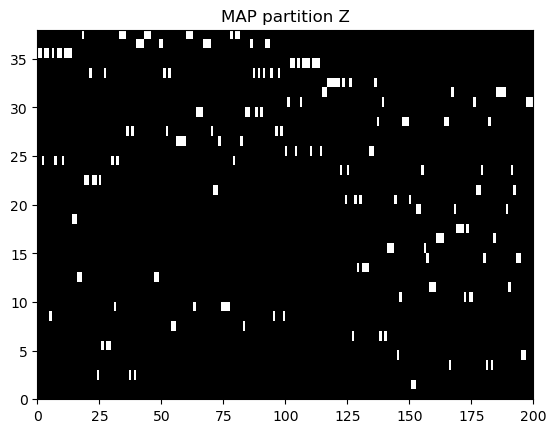

In [12]:
plt.figure()
plt.imshow(Z, interpolation='nearest', aspect='auto', cmap=plt.cm.gray, extent=(0, Z.shape[1], 0, Z.shape[0]))
plt.title('MAP partition Z')

### Brain map partitioned according to estimated Z

In [13]:
# Loading atlas
n_rois = 100
schaefer = ni.datasets.fetch_atlas_schaefer_2018(n_rois=n_rois) # default n_rois = 400

# extracting map matrix
map = nib.load(schaefer.maps)
map_mat = map.get_fdata() 
# checking that we can map back from numpy to nifti: map_recon = nib.Nifti1Image(map_mat, affine=map.affine)

# replace the values of the atlas with the values of the MAP partition
Zmap_mat = map_mat.copy()
node_labels = np.argmax(Z, axis=0) # label for each node
for i in range(n_rois):
    # note that(map_mat==0) is the background
    Zmap_mat[Zmap_mat==i+1] = node_labels[i]+1 # +1 because the background is 0

map_ni = nib.Nifti1Image(Zmap_mat, affine=map.affine)

/zhome/8a/1/127380/miniconda3/envs/speciale/lib/python3.9/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



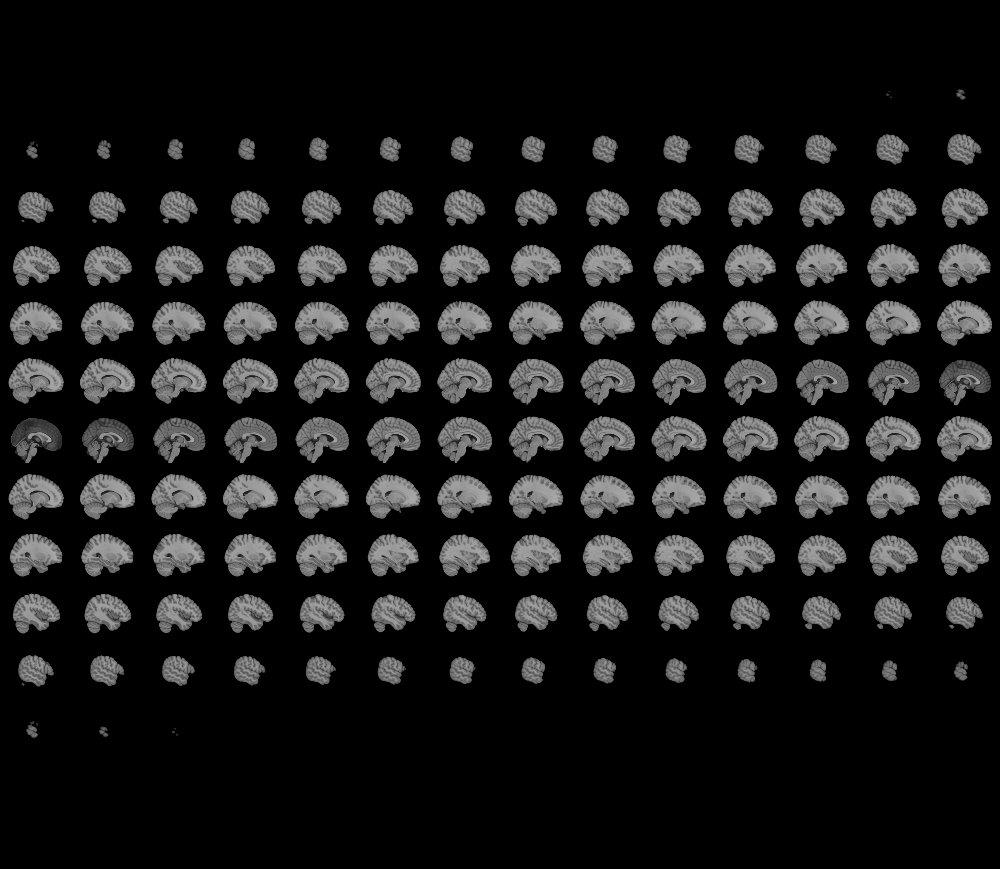
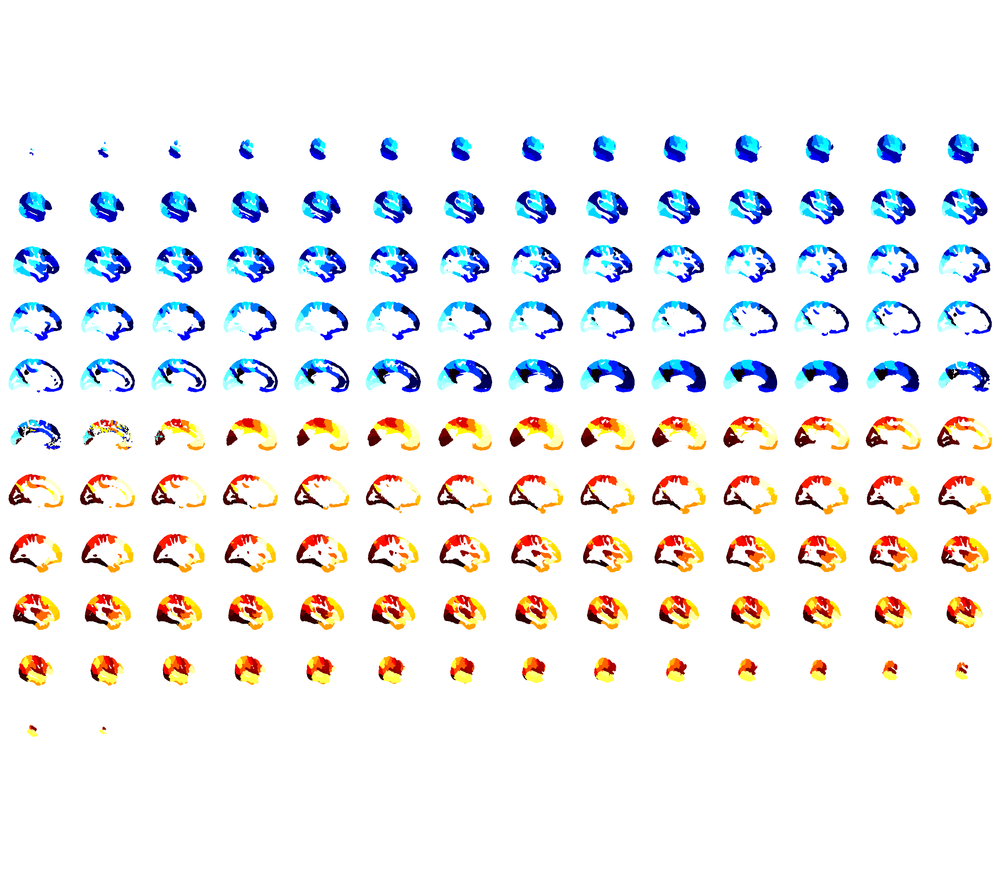

In [14]:
nplt.view_img(map, symmetric_cmap=False)

/zhome/8a/1/127380/miniconda3/envs/speciale/lib/python3.9/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



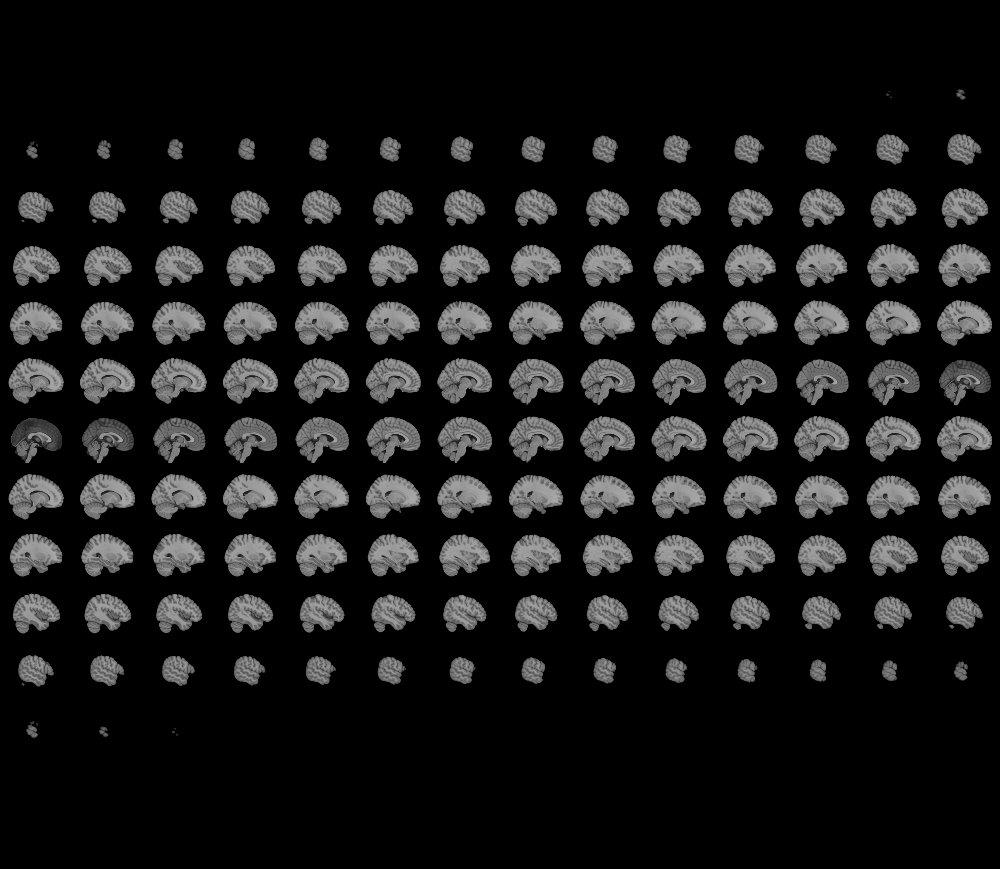
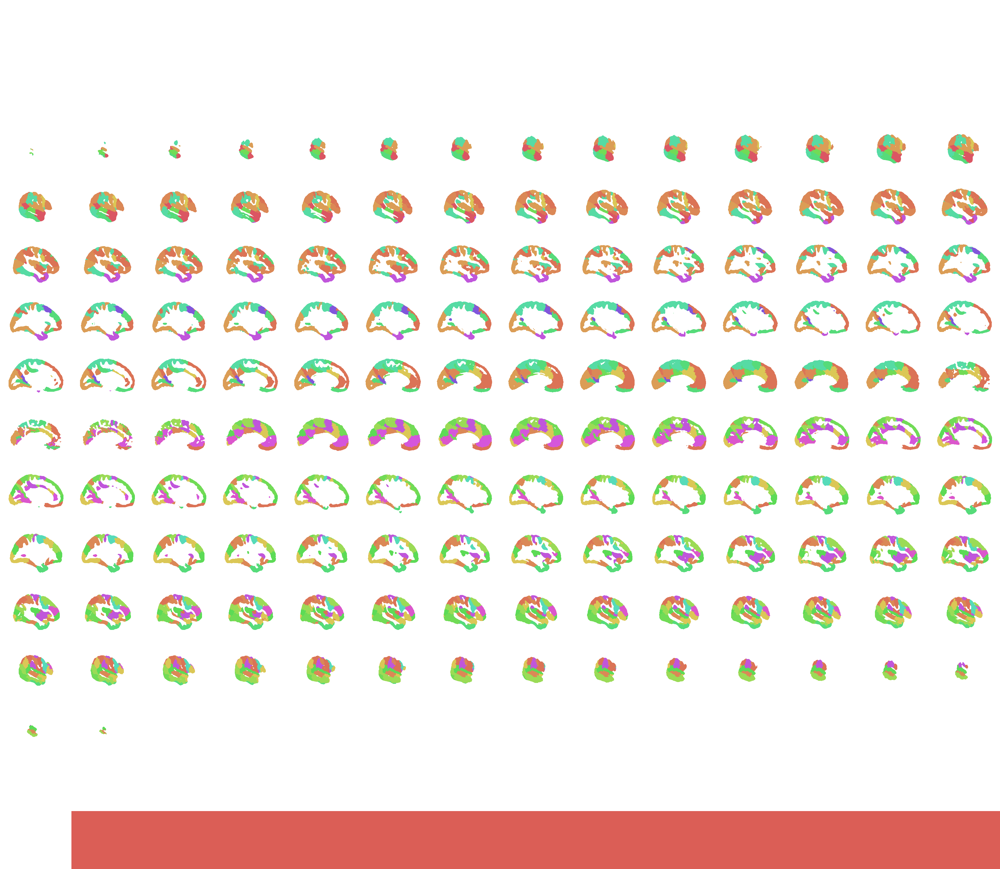

In [15]:
cmap_all = colors.ListedColormap(sns.color_palette('hls', noc))

nplt.view_img(map_ni, cmap = cmap_all, symmetric_cmap=False)

### Circular graph using networkx

/tmp/ipykernel_25023/2246223024.py:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


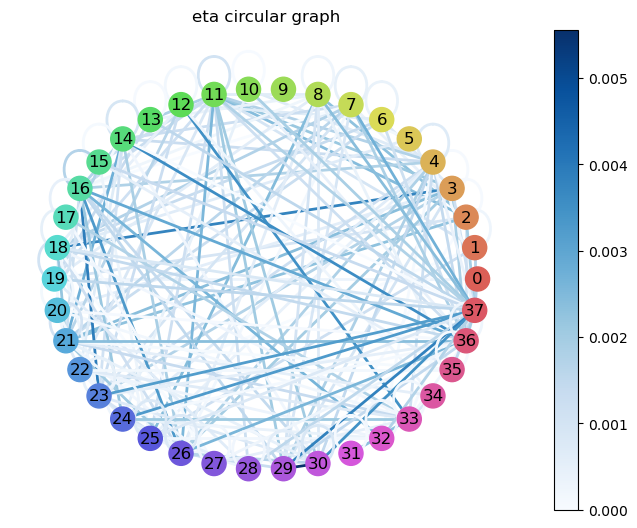

In [30]:
sub = 3
eta_fmri = eta[:,:,:250]
eta_dmri = eta[:,:,250:]
eta_std = np.std(eta,axis=2)
eta_example = eta_dmri[:,:,sub]
eta_example = np.triu(eta_example) # upper triangular matrix

# create a graph from the matrix
G = nx.from_numpy_array(eta_example)

# remove self-edges
#G.remove_edges_from(nx.selfloop_edges(G))

# set edge colors based on the edge weights
threshold = 0.002  # set the threshold here (based on np.percentile(eta_example.flatten(),99))
edge_colors = [eta_example[i, j] for i, j in zip(*np.where(np.triu(eta_example) > threshold))]
edge_cmap = plt.cm.Blues

# draw the graph in a circular layout
pos = nx.circular_layout(G)
node_color = sns.color_palette('hls', noc)

# add only edges above the threshold
G_thresh = nx.Graph()
for i in range(noc):
    G_thresh.add_node(i)
for i, j in zip(*np.where(np.triu(eta_example) > threshold)):
    G_thresh.add_edge(i, j, weight=eta_example[i, j])

nx.draw_circular(G_thresh, with_labels=True, node_color=node_color, node_size=300,
                 edge_color=edge_colors, edge_cmap=edge_cmap, width=2,
                 font_size=12)

# add a colorbar for the edge colors
sm = plt.cm.ScalarMappable(cmap=edge_cmap, norm=plt.Normalize(vmin=eta_example.min(), vmax=eta_example.max()))
sm.set_array([])
plt.colorbar(sm)

# show the plot
plt.title('eta circular graph')
#plt.title('eta example subject ' + str(sub))
plt.show()

Text(0.5, 1.0, 'eta matrix')

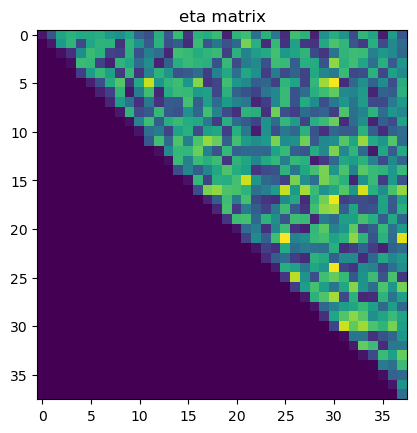

In [25]:
plt.imshow(eta_example)
plt.title('eta matrix')

#### Visualizing clusters with most different functional connectivty across subjects as brain map (clusters: 5 and 30)

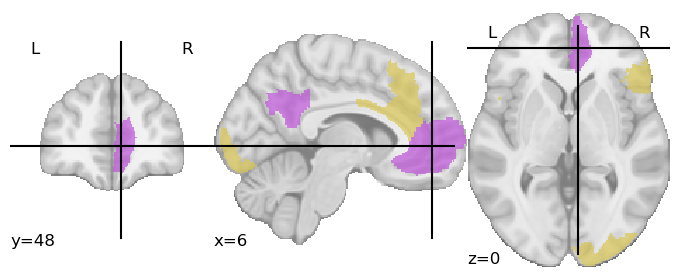

In [28]:
Zmap_mat5_30 = np.where((Zmap_mat == 5) | (Zmap_mat == 30), Zmap_mat, 0)
map_ni5_30 = nib.Nifti1Image(Zmap_mat5_30, affine=map.affine)
cmap5_30 = colors.ListedColormap([node_color[5], node_color[30]])
nplt.plot_roi(map_ni5_30, cmap=cmap5_30)

interpretation: the structural and functional connectivity level between the two clusters differs (the functional connectivity between the two areas are significantly higher than the structural connectivity) meaning that the connectivity between the purple and yellow cluster is of different significance wrt. structure and function.

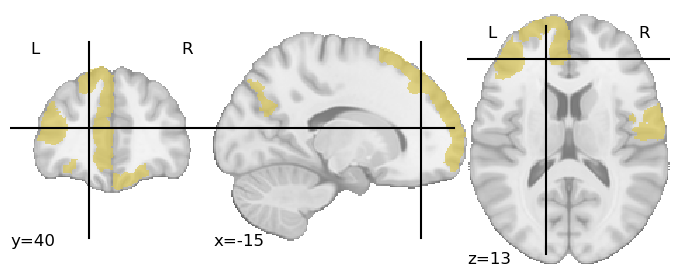

In [27]:
Zmap_mat41 = np.where((Zmap_mat == 4) | (Zmap_mat == 1), Zmap_mat, 0)
map_ni41 = nib.Nifti1Image(Zmap_mat41, affine=map.affine)
cmap41 = colors.ListedColormap([node_color[5], node_color[30]])
nplt.plot_roi(map_ni41, cmap=cmap41)

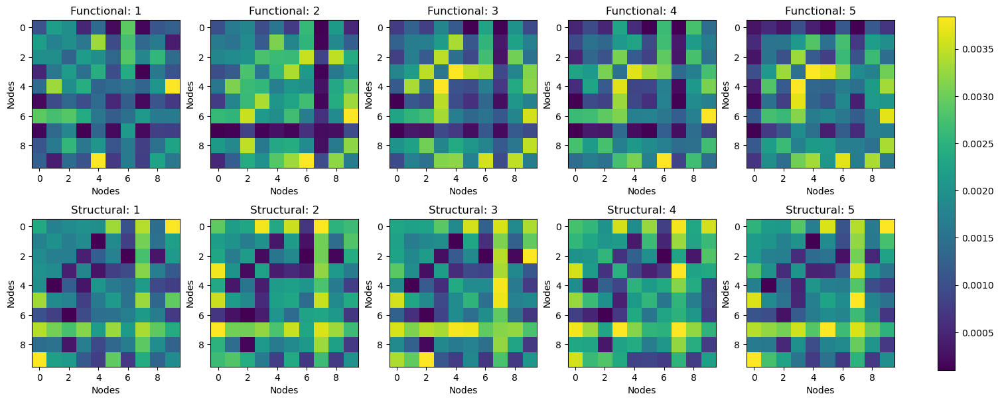

In [326]:
eta_fmri = eta[:,:,:250]
eta_dmri = eta[:,:,250:]

fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].imshow(eta_fmri[:,:,s])
        axs[s].set_title('Functional: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].imshow(eta_dmri[:,:,-(s-4)])
        axs[s].set_title('Structural: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
        
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.95)

### Classification

In [96]:
def get_x_data(eta):
    eta_triu_list = []
    for s in range(eta.shape[-1]):
        eta_triu_mat = np.triu(eta[:,:,s])
        eta_triu_vec = eta_triu_mat[np.triu_indices(eta_triu_mat.shape[-1])]
        eta_triu_list.append(eta_triu_vec)
    return np.array(eta_triu_list) # shape: n_samles x n_features

In [224]:
eta.shape

(10, 10, 500)

In [225]:
eta_triu_list = []
for s in range(eta.shape[-1]):
    eta_triu_mat = np.triu(eta[:,:,s])
    eta_triu_vec = eta_triu_mat[np.triu_indices(eta_triu_mat.shape[-1])]
    eta_triu_list.append(eta_triu_vec)

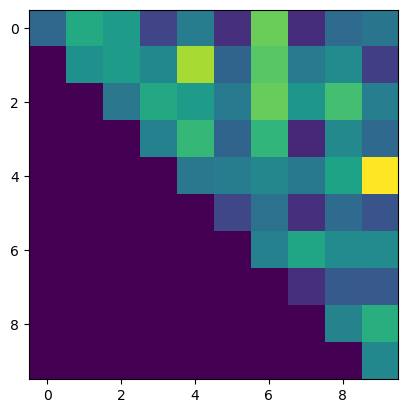

In [226]:
plt.imshow(np.triu(eta[:,:,0]))

In [227]:
# reshape to eta to (n_samples, n_features)
#x_data = x_data.reshape(x_data.shape[0]*x_data.shape[1], x_data.shape[2]).T
x_data = get_x_data(eta)
print('x_data shape:', x_data.shape)

# create target data: y_data (labels)
S1 = 250
S2 = 250
y_data = np.concatenate((np.zeros(S1), np.ones(S2)))
print('y_data shape:', y_data.shape)

x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.25, random_state=0)
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)

x_data shape: (500, 55)
y_data shape: (500,)
x_train shape: (375, 55)
x_test shape: (125, 55)
y_train shape: (375,)
y_test shape: (125,)


Text(0.5, 1.0, 'Accuracy Score: 1.0')

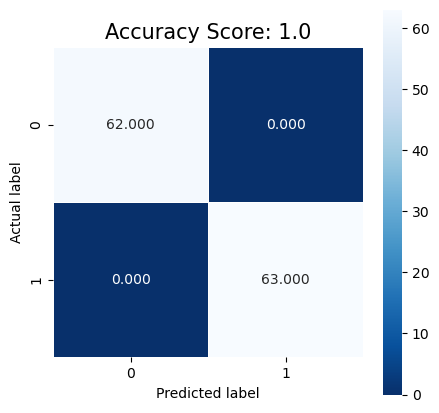

In [229]:
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)

# predict on entire test data
y_pred = logisticRegr.predict(x_test)

# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
#print(score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
#print(cm)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.title('Accuracy Score: {0}'.format(score), size = 15)

Text(0.5, 1.0, 'Accuracy Score: 1.0')

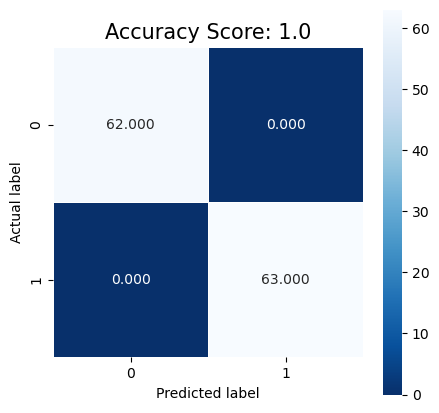

In [230]:
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)

# predict
y_pred = rfc.predict(x_test)

# accuracy score
score = rfc.score(x_test, y_test)
#print('Accuracy:', score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
#print(cm)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

Text(0.5, 1.0, 'Accuracy Score: 1.0')

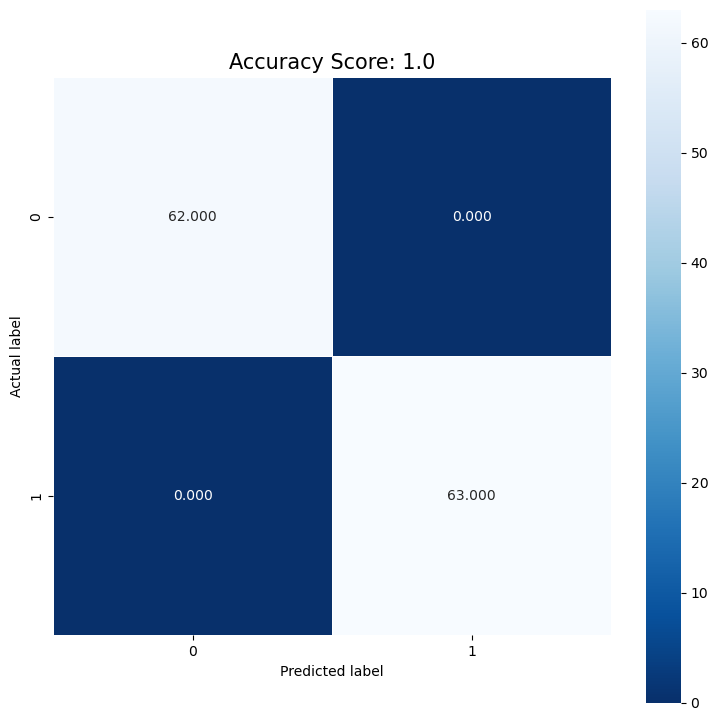

In [49]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

# predict
y_pred = knn.predict(x_test)

# accuracy score
score = knn.score(x_test, y_test)
#print('Accuracy:', score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
#print(cm)

plt.figure(figsize(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

# DecNef data experiments

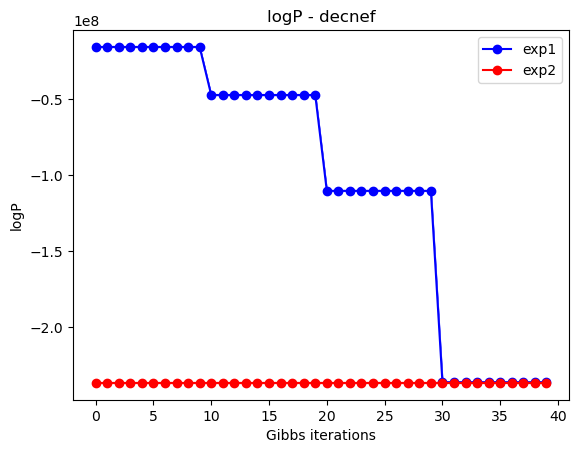

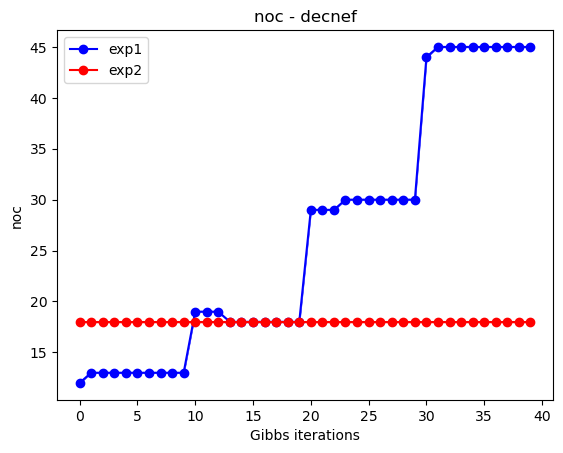

In [8]:
dataset = 'decnef'

# obs! should be the exact same nonparametric experiment just wtih different random seeds
exp_folder_list1 = ['nonparametric_schaefer100_2023-05-04 13:21:29.781275']
                    

# obs! should be the exact same paraemtric experiment just wtih different random seeds
exp_folder_list2 = ['parametric_schaefer100_2023-05-04 13:21:29.778777']


plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=True, miniter_gibbs=0, maxiter_gibbs=400)
plot_par(dataset, exp_folder_list1, exp_folder_list2, par='noc', plot1=True, plot2=True, miniter_gibbs=0, maxiter_gibbs=400)

#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=True, plot2=False, miniter_gibbs=0, maxiter_gibbs=100)

# these four plots should be made into a subplot with 1 row and 4 columns
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=0, maxiter_gibbs=100)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=100, maxiter_gibbs=200)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=200, maxiter_gibbs=300)
#plot_par(dataset, exp_folder_list1, exp_folder_list2, par='logP', plot1=False, plot2=True, miniter_gibbs=300, maxiter_gibbs=400)

### MAP sample

In [3]:
dataset = 'hcp'
exp_name = 'parametric_schaefer300_2023-05-09 13:01:00.758186'
# load result 
sample = np.load(main_dir+'/results/'+dataset+'/'+exp_name+'/model_sample.npy', allow_pickle=True).item()
MAP_sample = sample['MAP']

In [4]:
iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
alpha = MAP_sample['alpha']
eta0 = MAP_sample['eta0']

In [5]:
sample['iter']

[10, 20, 30]

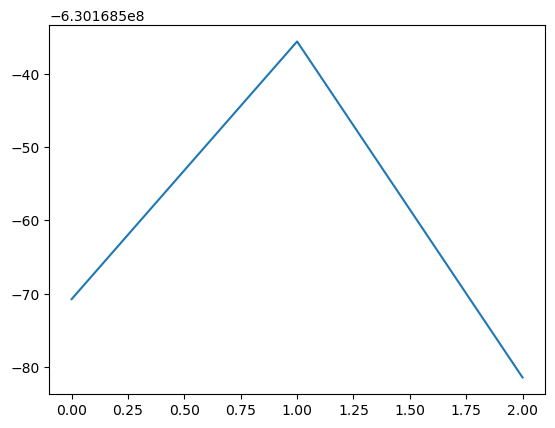

In [6]:
plt.plot(sample['logP'])

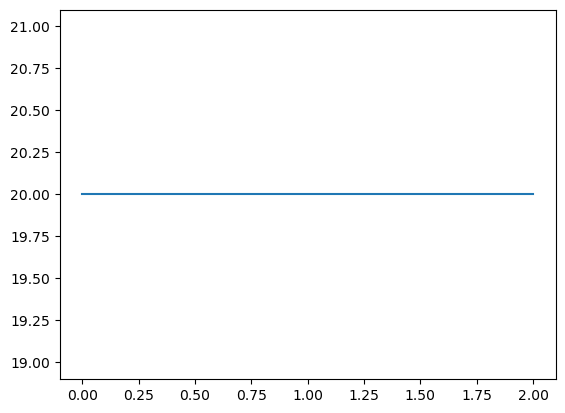

In [7]:
plt.plot(sample['noc'])

Text(0.5, 1.0, 'Convergence of logP (relative change)')

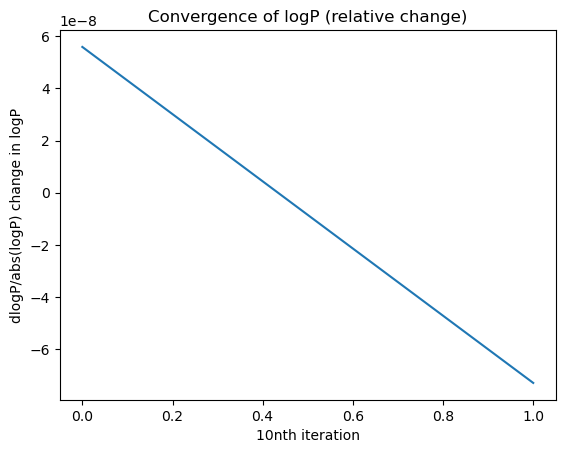

In [8]:
dlogP = np.diff(sample['logP'])
plt.plot(dlogP / np.abs(sample['logP'][:-1]))
plt.xlabel('10nth iteration')
plt.ylabel('dlogP/abs(logP) change in logP')
plt.title('Convergence of logP (relative change)')

In [9]:
dlogP = np.diff(sample['logP'][-2:])
abslogP = abs(sample['logP'][-2])

In [ ]:
test_logP = np.

In [14]:
test_logP

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [15]:
test_logP[-10:]

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [16]:
np.mean(np.diff(test_logP)/abs(test_logP[:-1]))

0.3397321428571428

In [12]:
dlogP = np.diff(test_logP[-2:])

In [80]:
test_logP[-2:]

array([8, 9])

In [109]:
np.array([test_logP[-3],test_logP[-1]])

array([7, 9])

In [107]:
test_logP

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [81]:
np.mean(np.diff(test_logP)/abs(test_logP[:-1]))

0.3397321428571428

In [82]:
([test_logP[-3],test_logP[-1]])

[7, 9]

In [114]:
np.diff([test_logP[-3],test_logP[-1]])[0]/abs(test_logP[-1])

0.2222222222222222

In [116]:
np.diff([test_logP[-3],test_logP[-1]])/np.abs(test_logP[-1])

array([0.22222222])

In [99]:
np.diff([test_logP[-3],test_logP[-1]])

array([2])

In [106]:
np.diff((test_logP[-3],test_logP[-1]))/np.abs(test_logP[-1])

array([0.22222222])

In [63]:
[test_logP[-3],test_logP[-1]]

[7, 9]

In [60]:
np.diff([test_logP[-3],test_logP[-1]])

array([2])

In [58]:
dlogP

array([1])

In [74]:
np.mean((np.diff(sample['logP']) / np.abs(sample['logP'][:-1]))[10:])

1.597593424876579e-08

In [58]:
logP - np.min(sample['logP'][-11:-1])

131.88235899806023

In [50]:
iter

380

In [53]:
logP

-236813692.44327918

In [55]:
sample['logP'][int(iter/10)-1]

-236813692.44327918

In [12]:
print('logP(Z|A) =', logP)
print('noc =', noc)
print('alpha =', alpha)
#print('eta0 =', eta0)

logP(Z|A) = -236813692.44327918
noc = 18
alpha = 279696802121341.34


In [18]:
logP-1e-4

-236813692.44337916

Text(0.5, 0, 'subject')

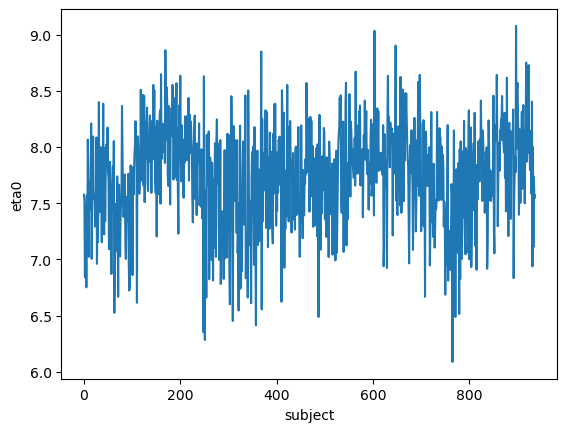

In [19]:
plt.plot(eta0)
plt.ylabel('eta0')
plt.xlabel('subject')

Text(0.5, 1.0, 'MAP partition Z')

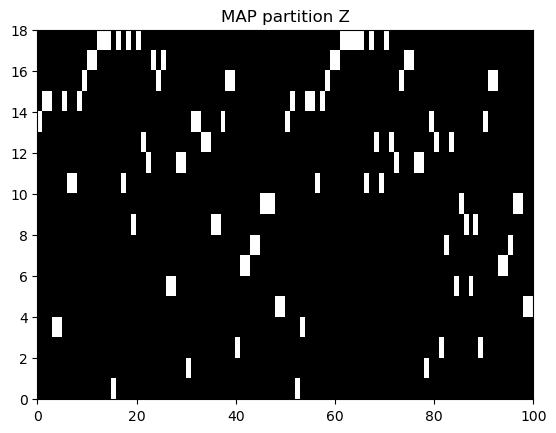

In [20]:
plt.figure()
plt.imshow(Z, interpolation='nearest', aspect='auto', cmap=plt.cm.gray, extent=(0, Z.shape[1], 0, Z.shape[0]))
plt.title('MAP partition Z')

In [21]:
eta.shape

(18, 18, 937)

### Brain map partitioned according to estimated Z

/zhome/8a/1/127380/miniconda3/envs/speciale/lib/python3.9/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



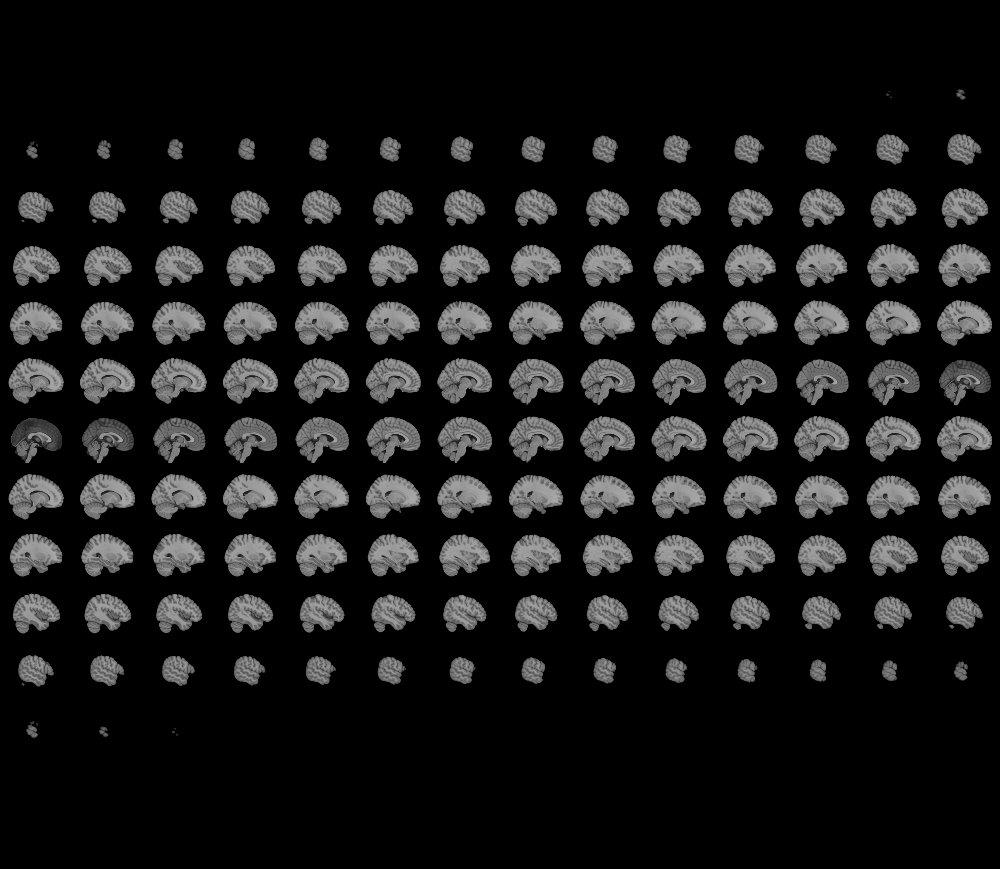
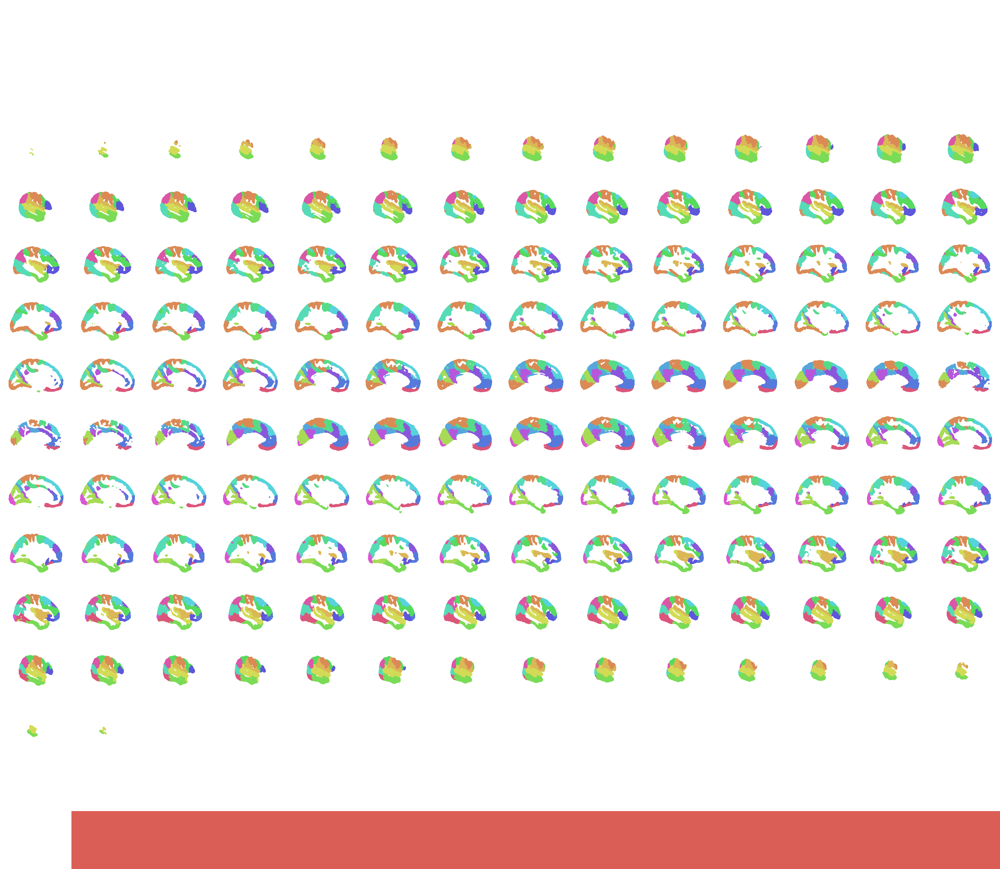

In [22]:
# Loading atlas
n_rois = 100
schaefer = ni.datasets.fetch_atlas_schaefer_2018(n_rois=n_rois) # default n_rois = 400

# extracting map matrix
map = nib.load(schaefer.maps)
map_mat = map.get_fdata() 
# checking that we can map back from numpy to nifti: map_recon = nib.Nifti1Image(map_mat, affine=map.affine)

# replace the values of the atlas with the values of the MAP partition
Zmap_mat = map_mat.copy()
node_labels = np.argmax(Z, axis=0) # label for each node
for i in range(n_rois):
    # note that(map_mat==0) is the background
    Zmap_mat[Zmap_mat==i+1] = node_labels[i]+1 # +1 because the background is 0

map_ni = nib.Nifti1Image(Zmap_mat, affine=map.affine)
cmap_all = colors.ListedColormap(sns.color_palette('hls', noc))
nplt.view_img(map_ni, cmap = cmap_all, symmetric_cmap=False)

### Circular graph using networkx

/tmp/ipykernel_29708/2632273834.py:45: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm)


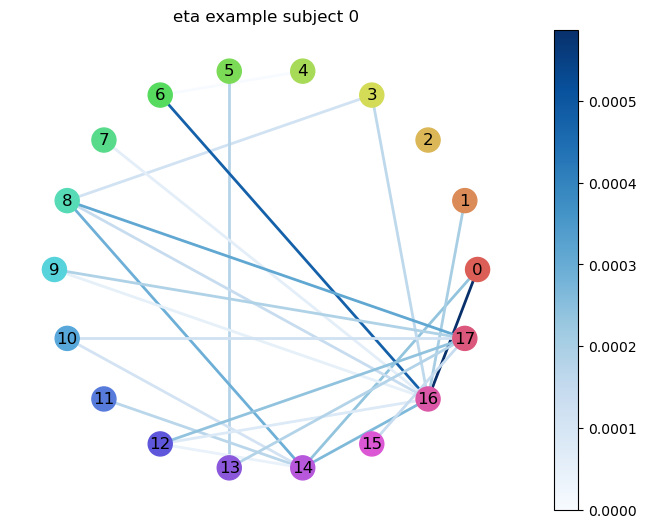

In [41]:
sub = 0
eta_example = eta[:,:,sub]
eta_example = eta_std
eta_example = np.triu(eta_example) # upper triangular matrix

# create a graph from the matrix
G = nx.from_numpy_array(eta_example)

# remove self-edges
#G.remove_edges_from(nx.selfloop_edges(G))

# set edge colors based on the edge weights
#edge_colors = eta_example[np.triu_indices_from(eta_example, k=1)] # if self-edges are removed
#edge_colors = eta_example[np.triu_indices_from(eta_example)]
#edge_cmap = plt.cm.Blues

# set edge colors based on the edge weights
threshold = 0.0005#0.002  # set the threshold here (based on np.percentile(eta_example.flatten(),99))
edge_colors = [eta_example[i, j] for i, j in zip(*np.where(np.triu(eta_example) > threshold))]
edge_cmap = plt.cm.Blues


# draw the graph in a circular layout
pos = nx.circular_layout(G)
node_color = sns.color_palette('hls', noc)

# add only edges above the threshold
G_thresh = nx.Graph()
for i in range(noc):
    G_thresh.add_node(i)
for i, j in zip(*np.where(np.triu(eta_example) > threshold)):
    G_thresh.add_edge(i, j, weight=eta_example[i, j])

nx.draw_circular(G_thresh, with_labels=True, node_color=node_color, node_size=300,
                 edge_color=edge_colors, edge_cmap=edge_cmap, width=2,
                 font_size=12)

#nx.draw_circular(G, with_labels=True, node_color=node_color, node_size=1000,
#                 edge_color=edge_colors, edge_cmap=edge_cmap, width=2,
#                 font_size=12)

# add a colorbar for the edge colors
sm = plt.cm.ScalarMappable(cmap=edge_cmap, norm=plt.Normalize(vmin=eta_example.min(), vmax=eta_example.max()))
sm.set_array([])
plt.colorbar(sm)

# show the plot
plt.title('eta example subject ' + str(sub))
plt.show()

In [36]:
np.percentile(eta_example.flatten(),99)

0.0005431229379460671

based on circular graph plot, there appear to be "stronger" link probability between 
- cluster 1 and 29
- cluster 12 and 29
- cluster 20 and 29
- cluster 26 and 36

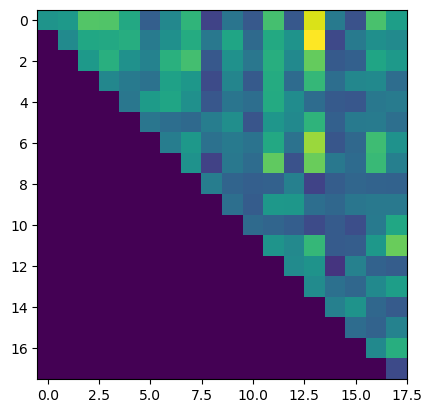

In [24]:
plt.imshow(np.triu(eta[:,:,0]))

In [29]:
eta_std = np.std(eta,axis=2)

In [31]:
eta_std.shape

(18, 18)

#### Visualizing clusters that are highly connected on brain (clusters: 1 and 13)

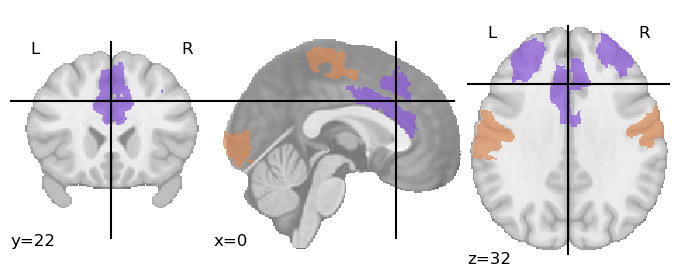

In [25]:
Zmap_mat1_13 = np.where((Zmap_mat == 1) | (Zmap_mat == 13), Zmap_mat, 0)
map_ni1_13 = nib.Nifti1Image(Zmap_mat1_13, affine=map.affine)
cmap1_13 = colors.ListedColormap([node_color[1], node_color[13]])
nplt.plot_roi(map_ni1_13, cmap=cmap1_13)

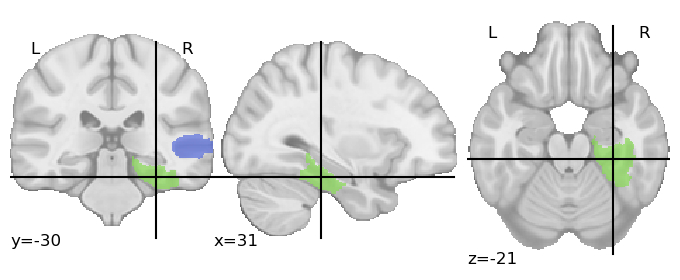

In [296]:
Zmap_mat12_29 = np.where((Zmap_mat == 12) | (Zmap_mat == 29), Zmap_mat, 0)
map_ni12_29 = nib.Nifti1Image(Zmap_mat12_29, affine=map.affine)
cmap12_29 = colors.ListedColormap([node_color[12], node_color[29]])
nplt.plot_roi(map_ni12_29, cmap=cmap12_29)

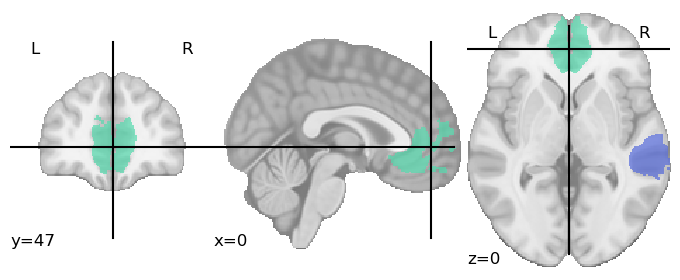

In [298]:
Zmap_mat20_29 = np.where((Zmap_mat == 20) | (Zmap_mat == 29), Zmap_mat, 0)
map_ni20_29 = nib.Nifti1Image(Zmap_mat20_29, affine=map.affine)
cmap20_29 = colors.ListedColormap([node_color[20], node_color[29]])
nplt.plot_roi(map_ni20_29, cmap=cmap20_29)

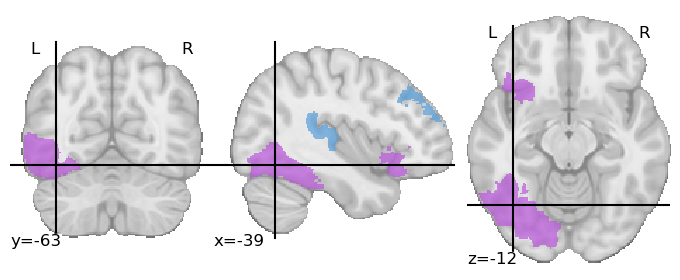

In [299]:
Zmap_mat26_36 = np.where((Zmap_mat == 26) | (Zmap_mat == 36), Zmap_mat, 0)
map_ni26_36 = nib.Nifti1Image(Zmap_mat26_36, affine=map.affine)
cmap26_36 = colors.ListedColormap([node_color[26], node_color[36]])
nplt.plot_roi(map_ni26_36, cmap=cmap26_36)

### Eta

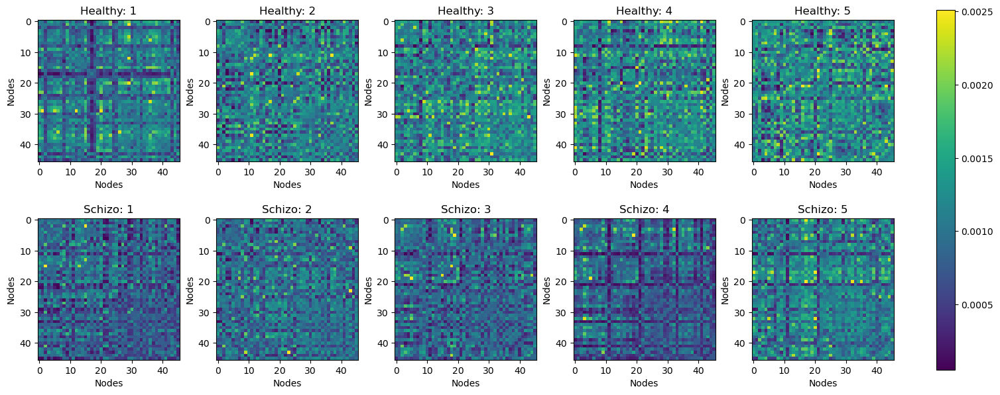

In [301]:
healthy_mask = np.load(main_dir+'/data/'+dataset+'/healthy_mask.npy')
schizo_mask = np.load(main_dir+'/data/'+dataset+'/schizo_mask.npy')

eta_healthy = eta[:,:,healthy_mask]
eta_schizo = eta[:,:,schizo_mask]

fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].imshow(eta_healthy[:,:,s])
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].imshow(eta_schizo[:,:,-(s-4)])
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.95)

In [60]:
male_mask = np.load(main_dir+'/data/'+dataset+'/male_mask.npy')
female_mask = np.load(main_dir+'/data/'+dataset+'/female_mask.npy')

eta_male = eta_healthy[:,:,male_mask]
eta_female = eta_healthy[:,:,female_mask]

fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].imshow(eta_male[:,:,s])
        axs[s].set_title('Male: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].imshow(eta_female[:,:,-(s-4)])
        axs[s].set_title('Female: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.95)

### Classification

In [84]:
# reshape to eta to (n_samples, n_features)
x_data = np.triu(eta_healthy)

x_data = x_data.reshape(x_data.shape[0]*x_data.shape[1], x_data.shape[2]).T
print('x_data shape:', x_data.shape)

# create target data: y_data (labels)
'''
S1 = sum(healthy_mask)
S2 = sum(schizo_mask)
y_data = np.concatenate((np.zeros(S1), np.ones(S2)))
# y_data = schizo_mask
'''
y_data = male_mask # or female_mask
print('y_data shape:', y_data.shape)

x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.3, random_state=0)
print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)
print('y_train shape:', y_train.shape)
print('y_test shape:', y_test.shape)

x_data shape: (791, 64)
y_data shape: (791,)
x_train shape: (553, 64)
x_test shape: (238, 64)
y_train shape: (553,)
y_test shape: (238,)


0.592436974789916
[[  0  97]
 [  0 141]]


Text(0.5, 1.0, 'Accuracy Score: 0.592436974789916')

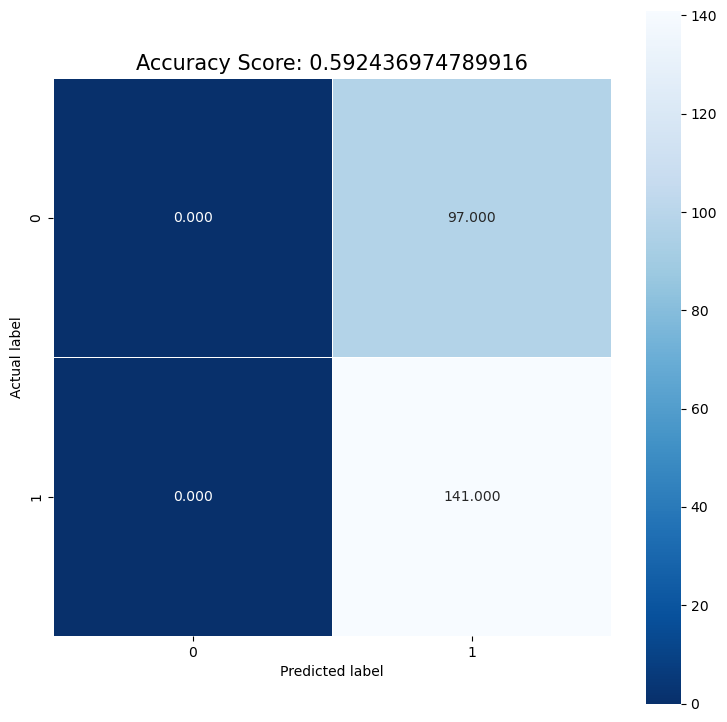

In [85]:
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)

# predict on entire test data
y_pred = logisticRegr.predict(x_test)

# Use score method to get accuracy of model
score = logisticRegr.score(x_test, y_test)
print(score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

Accuracy: 0.5504201680672269
[[57 40]
 [67 74]]


Text(0.5, 1.0, 'Accuracy Score: 0.5504201680672269')

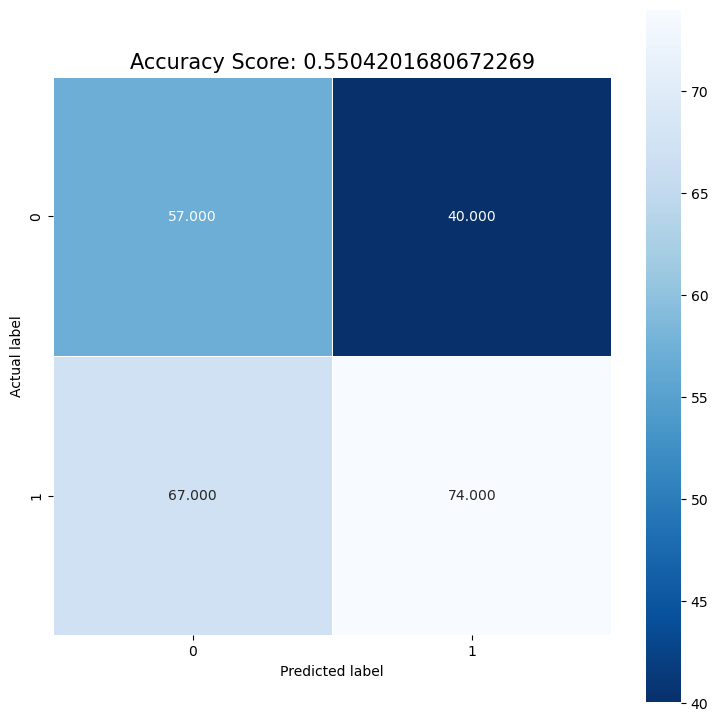

In [86]:
rfc = RandomForestClassifier()
rfc.fit(x_train, y_train)

# predict
y_pred = rfc.predict(x_test)

# accuracy score
score = rfc.score(x_test, y_test)
print('Accuracy:', score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

plt.figure(figsize(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

Accuracy: 0.6176470588235294
[[56 41]
 [50 91]]


Text(0.5, 1.0, 'Accuracy Score: 0.6176470588235294')

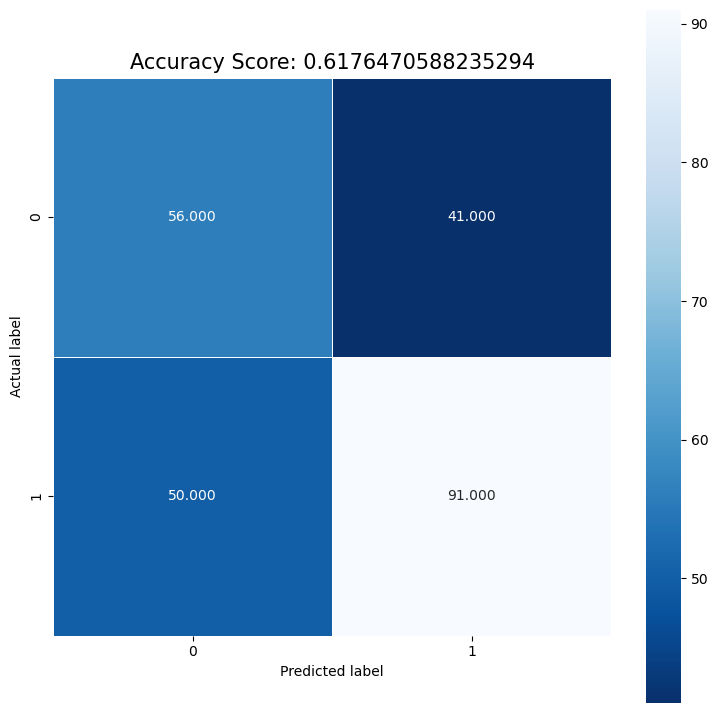

In [87]:
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)

# predict
y_pred = knn.predict(x_test)

# accuracy score
score = knn.score(x_test, y_test)
print('Accuracy:', score)

# confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

plt.figure(figsize(5,5))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15)

# Plotting adjacency matrices

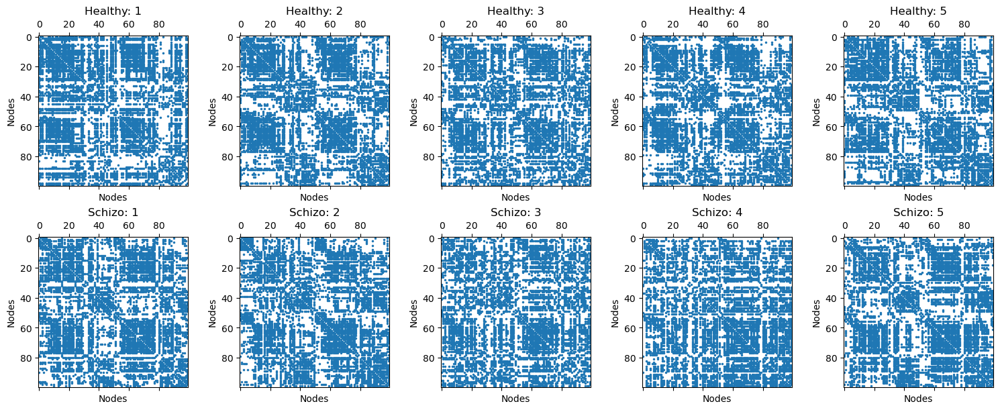

In [2]:
from data_processors import compute_A

my_dir = '/work3/s174162/speciale/'
n_rois = 100
data_folder = 'schaefer'+str(n_rois)
folder_path = os.path.join(my_dir, 'data/'+data_folder)
A0_vals_list = np.load(os.path.join(folder_path,'A0_vals_list.npy'))
A0 = compute_A(A0_vals_list, n_rois) # all subjects

# sparsity pattern of adjacency matrix (nonzero values are colored, zero values are white, nz = number of non-zero elements)
fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].spy(A0[:,:,s],marker='.',markersize=3)
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].spy(A0[:,:,-(s-4)],marker='.',markersize=3)
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

In [16]:
A0.shape

(100, 100, 937)

In [18]:
np.unique(A0)

array([0., 1.])

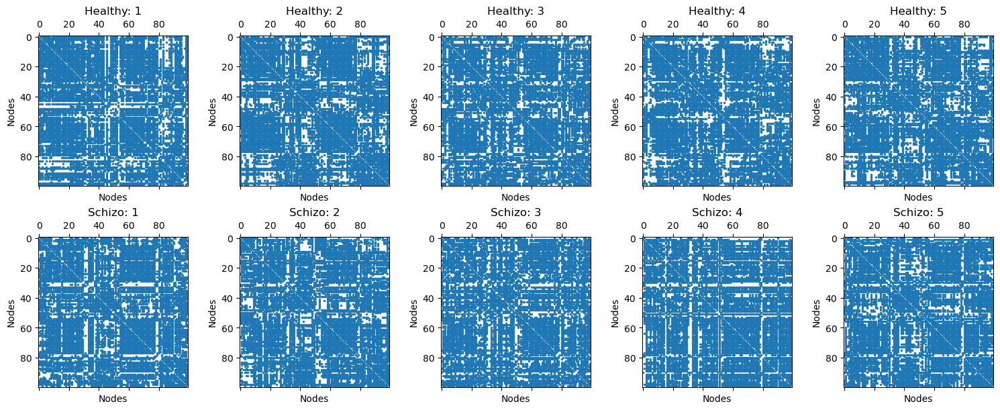

In [4]:
A1_vals_list = np.load(os.path.join(folder_path,'A1_vals_list.npy'))
A1 = compute_A(A1_vals_list, n_rois) # all subjects

# sparsity pattern of adjacency matrix (nonzero values are colored, zero values are white, nz = number of non-zero elements)
fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].spy(A1[:,:,s],marker='.',markersize=3)
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].spy(A1[:,:,-(s-4)],marker='.',markersize=3)
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

In [21]:
np.unique(A1)

array([0., 1., 2., 3.])

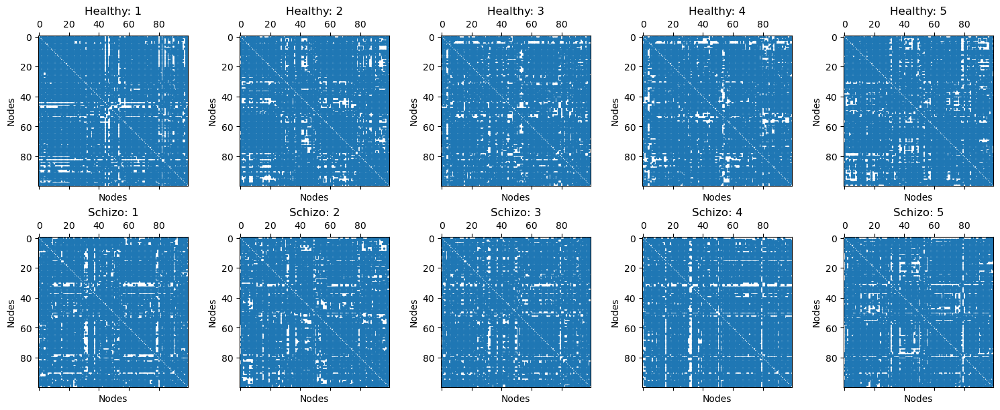

In [5]:
A2_vals_list = np.load(os.path.join(folder_path,'A2_vals_list.npy'))
A2 = compute_A(A2_vals_list, n_rois) # all subjects

# sparsity pattern of adjacency matrix (nonzero values are colored, zero values are white, nz = number of non-zero elements)
fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].spy(A2[:,:,s],marker='.',markersize=3)
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].spy(A2[:,:,-(s-4)],marker='.',markersize=3)
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

In [26]:
np.unique(A2)

array([0., 1., 2., 3., 4., 5., 6., 7.])

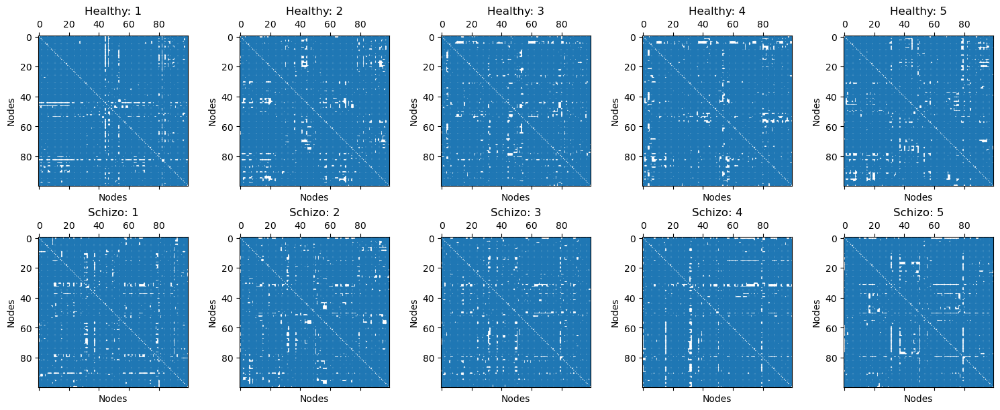

In [9]:
A3_vals_list = np.load(os.path.join(folder_path,'A3_vals_list.npy'))
A3 = compute_A(A3_vals_list, n_rois) # all subjects

# sparsity pattern of adjacency matrix (nonzero values are colored, zero values are white, nz = number of non-zero elements)
fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].spy(A3[:,:,s],marker='.',markersize=3)
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')
    else:
        im = axs[s].spy(A3[:,:,-(s-4)],marker='.',markersize=3)
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes')
        axs[s].set_xlabel('Nodes')

Number of nonzero elements:


(4950, 7424, 8662, 9280)

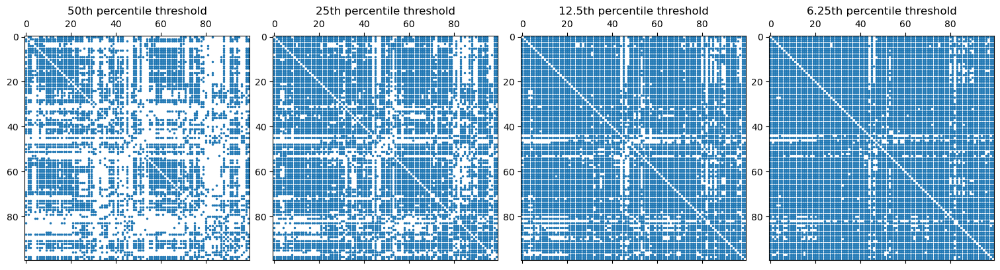

In [10]:

# showing the four different graphs for a single subject
sub_id = 0
fig, axs = plt.subplots(1,4, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()
axs[0].spy(A0[:,:,sub_id], marker='.', markersize=3)
axs[0].set_title('50th percentile threshold')
axs[1].spy(A1[:,:,sub_id], marker='.', markersize=3)
axs[1].set_title('25th percentile threshold')
axs[2].spy(A2[:,:,sub_id], marker='.', markersize=3)
axs[2].set_title('12.5th percentile threshold')
axs[3].spy(A3[:,:,sub_id], marker='.', markersize=3)
axs[3].set_title('6.25th percentile threshold')

print('Number of nonzero elements:')
(A0[:,:,sub_id] > 0).sum(), (A1[:,:,sub_id] > 0).sum(), (A2[:,:,sub_id] > 0).sum(), (A3[:,:,sub_id] > 0).sum()

In [20]:
import plotly.express as px
px.imshow(A0[:,:,sub_id])

In [239]:
# convert from one-hot representation to integer representation 0, 1, .., K-1 for each node
Z_int = np.argmax(Z.T, 1).astype('int')

In [240]:
# sort by based assigned cluster
sort_idx = np.argsort(Z_int)
A_sorted = A[sort_idx, :, :][:, sort_idx, :]

In [241]:
A_sorted.shape

(300, 300, 1409)

In [242]:
A_sorted_healthy = A_sorted[:,:,healthy_bool]
A_sorted_schizo = A_sorted[:,:,schizo_bool]

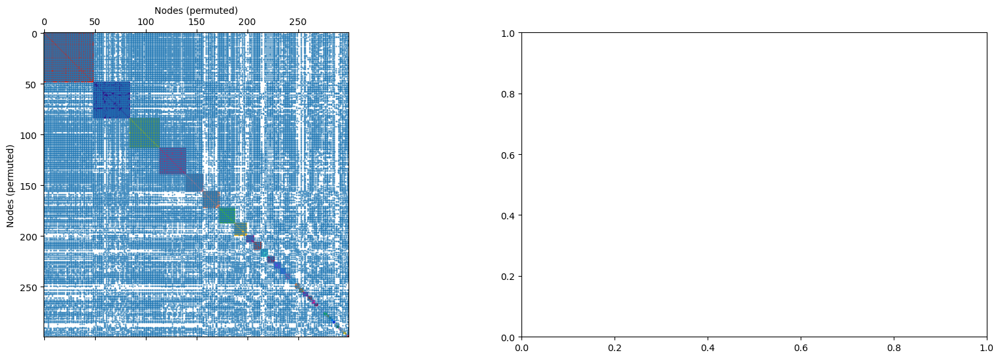

In [243]:
from collections import Counter
import random
# count number nodes in each cluster
count = Counter(Z_int[sort_idx])

# plot
#colors = np.array(plt.cm.Accent.colors)
colors = []
for i in range(len(count)):
    colors.append('#%06X' % random.randint(0, 0xFFFFFF))
fig, axes = plt.subplots(1, 1, figsize=(20, 6))

example_subject = 0 
# plot adjacency matrix
axes[0].spy(A_sorted[:,:,example_subject], marker='.', markersize=1)
axes[0].grid(False)
axes[0].set_ylabel('Nodes (permuted)')
axes[0].xaxis.set_label_position('top') 
axes[0].set_xlabel('Nodes (permuted)')

# draw clusters partitions on adjacency matrix
last_val = -0.5
for i, x in enumerate(np.cumsum(list(count.values()))):
    size = x - last_val
    axes[0].add_patch(plt.Rectangle((last_val,last_val), size, size, fc=colors[i], ec=colors[i]))
    last_val = x


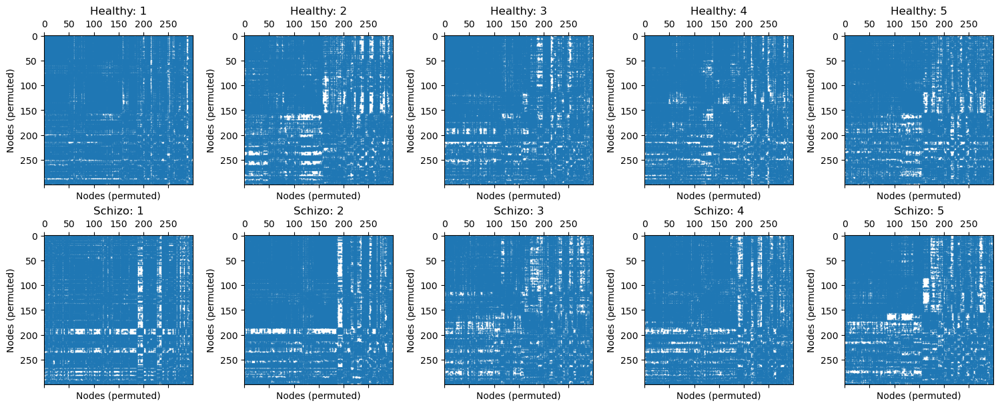

In [244]:
# sparsity pattern of adjacency matrix (nonzero values are colored, zero values are white, nz = number of non-zero elements)
fig, axs = plt.subplots(2,5, figsize=(15, 6), constrained_layout=True)
axs = axs.ravel()

for s in range(10):
    if s < 5:
        im = axs[s].spy(A_sorted_healthy[:,:,s],marker='.',markersize=1)
        axs[s].set_title('Healthy: '+str(s+1))
        axs[s].set_ylabel('Nodes (permuted)')
        axs[s].set_xlabel('Nodes (permuted)')
        
    else:
        im = axs[s].spy(A_sorted_schizo[:,:,s-5],marker='.',markersize=1)
        axs[s].set_title('Schizo: '+str(s-4))
        axs[s].set_ylabel('Nodes (permuted)')
        axs[s].set_xlabel('Nodes (permuted)')